# Описание проекта


Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных:**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  - 0 — заведение не является сетевым
  - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Навыки и инструменты:**
- Pandas
- Plotly
- Python
- Seaborn
- визуализация данных

## Загрузка и изучение данных 

### Загрузка данных

In [1]:
import pandas as pd
import seaborn as sb
import numpy as np
import json
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import folium

from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

%config InlineBackend.figure_format = 'retina'
sb.set_palette('pastel') 

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv', sep=',') 
except:
    data = pd.read_csv('https://code.s3.yandex.net//datasets/moscow_places.csv', sep=',') 

In [3]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


### Изучение данных

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Мы видим, что всего в датасете 8406 строк, но есть пропуски в некоторых столбцах, их мы изучим далее. Также далее изменим типы данных в некоторых столбцах для удобства исследования.

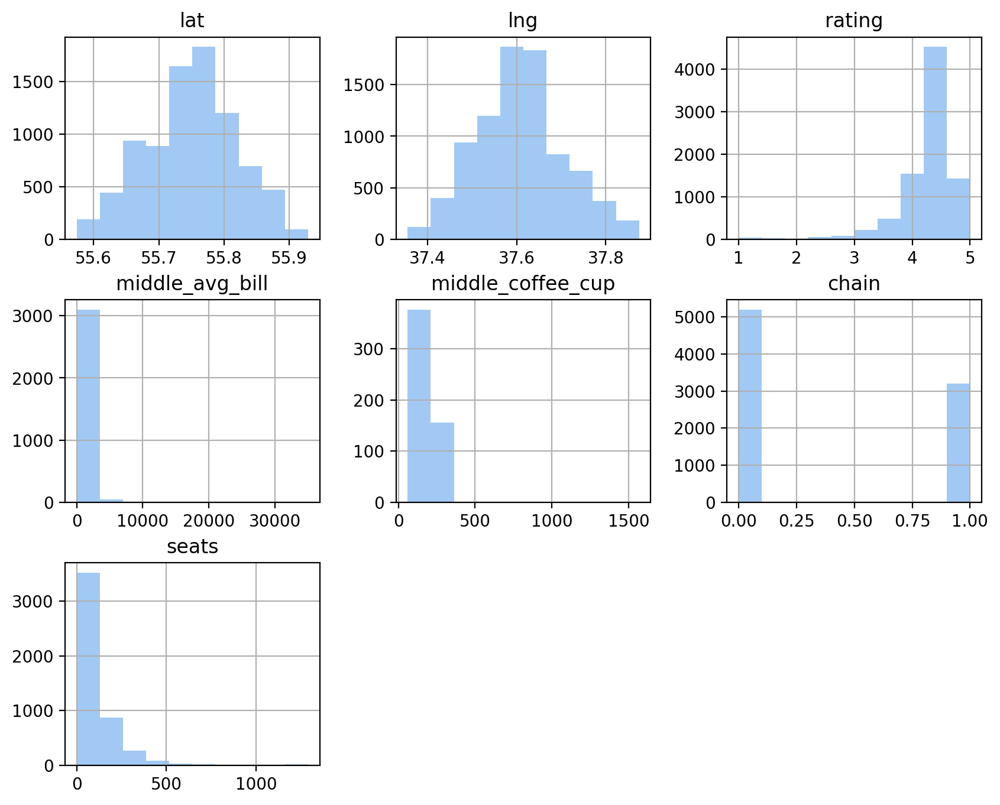

In [5]:
data.hist(figsize=(10, 8));

По гистограммам, мы видим, что в данных есть выбросы, далее изучим их.

## Предобработка данных

### Пропуски данных

In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Видим, что в столбцах `hours`,`price`,`avg_bill`,`middle_avg_bill`,`middle_coffee_cup`,seats` есть пропуски. Посмотрим на каждый столбец поближе.

In [7]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Пропуски в этом столбце нельзя заполнить числовыми значениями, так как все данные в столбце типа object и все заведения имеют свой график работы.

In [8]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

В этом столбце мы имеем категориальные данные, всего пропусков 5091 записей, что довольно много. Так как числовыми значениями мы заполнить не можем, оставим пропуски как есть.

In [9]:
data['avg_bill'].unique()

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

Опять же данные категориальные, можно бло заменить на средние или медианные значения, но среднее значение зависит от многих факторов: удаленность от центра, стоимость блюд и многое другое. Оставим пока пропуски, как есть.

In [10]:
data['middle_avg_bill'].unique()

array([      nan, 1.550e+03, 1.000e+03, 5.000e+02, 1.990e+02, 2.500e+02,
       1.100e+03, 3.300e+02, 1.500e+03, 4.000e+02, 2.450e+02, 4.250e+02,
       9.000e+02, 2.400e+02, 2.250e+02, 3.280e+02, 3.000e+02, 3.450e+02,
       2.300e+02, 6.500e+02, 7.500e+02, 1.250e+03, 1.750e+03, 2.250e+03,
       6.000e+02, 4.500e+02, 8.500e+02, 2.100e+03, 3.490e+02, 2.000e+02,
       1.200e+02, 2.690e+02, 1.300e+03, 1.150e+03, 3.550e+02, 2.750e+02,
       1.200e+03, 5.750e+02, 3.500e+02, 7.000e+02, 2.840e+02, 1.500e+02,
       3.620e+02, 3.250e+02, 2.000e+03, 2.910e+02, 2.800e+02, 2.750e+03,
       1.400e+03, 2.500e+03, 2.150e+03, 5.000e+03, 8.250e+02, 6.250e+02,
       3.250e+03, 6.750e+02, 4.750e+02, 1.690e+03, 9.250e+02, 1.050e+03,
       3.400e+02, 9.500e+02, 1.025e+03, 3.210e+02, 5.500e+02, 3.600e+02,
       3.750e+02, 3.170e+02, 3.240e+02, 3.430e+02, 1.400e+02, 1.650e+02,
       2.150e+02, 5.490e+02, 1.750e+02, 3.130e+02, 1.375e+03, 1.000e+02,
       9.750e+02, 1.100e+04, 8.000e+02, 2.950e+02, 

Здесь данные уже количественные, но из-за пропусков в других данных, это пропуски будет сложно заполнить верными значениями.Оставим пропуски как есть.

In [11]:
data['middle_coffee_cup'].unique()

array([  nan,  170.,  145.,  150.,  180.,  120.,  100.,  256.,  160.,
        250.,  165.,  149.,  135.,  220.,  175.,  195.,   60.,  214.,
         75.,   89.,   95.,  204.,   90.,  140.,  125.,  162.,  155.,
        154.,  297.,  205.,  124.,  200.,  190.,  134.,  139.,  287.,
        225.,  230.,  237.,  290.,  254.,  279.,  174.,  179.,  295.,
        245.,  105.,  285.,  270.,   84.,  127.,   80.,  112.,  185.,
        210.,  325.,  159.,  215.,  110.,  266.,  242.,  137.,  255.,
        240.,  217.,  315.,  130.,  167.,  169.,  235., 1568.,   79.,
        260.,  300.,  291.,  275.,  115.,  328.,   94.,  265.,  184.,
        229.,  164.,  172.,  259.,  246.,  199.,  138.,  375.,  189.,
        320.,  197.,  227.,  102.,  119.,  144.,  129.])

Также логически верными значениями сложно заполнить пропуски, оставим пропуски.

In [12]:
data['seats'].unique()

array([      nan, 4.000e+00, 4.500e+01, 1.480e+02, 7.900e+01, 6.500e+01,
       1.020e+02, 1.800e+02, 9.600e+01, 2.500e+01, 4.600e+01, 4.000e+01,
       2.470e+02, 2.100e+01, 8.000e+00, 3.500e+01, 2.400e+02, 8.500e+01,
       1.200e+01, 6.000e+01, 1.200e+02, 1.600e+01, 8.000e+01, 5.000e+01,
       4.400e+01, 4.300e+01, 9.000e+01, 0.000e+00, 1.980e+02, 9.500e+01,
       3.500e+02, 1.240e+02, 1.000e+01, 7.000e+01, 4.800e+01, 6.000e+00,
       9.800e+01, 3.000e+01, 5.200e+01, 2.000e+01, 2.000e+00, 1.800e+01,
       2.200e+01, 1.500e+01, 2.800e+01, 3.000e+02, 7.500e+01, 3.200e+01,
       1.000e+02, 1.100e+02, 2.300e+02, 2.500e+02, 1.300e+02, 8.400e+01,
       3.980e+02, 2.700e+01, 2.860e+02, 1.450e+02, 3.600e+01, 9.700e+01,
       2.260e+02, 1.400e+02, 1.660e+02, 2.020e+02, 9.400e+01, 1.890e+02,
       5.300e+01, 1.040e+02, 7.200e+01, 1.310e+02, 1.050e+02, 5.500e+01,
       1.700e+01, 1.000e+00, 1.150e+02, 3.100e+02, 7.700e+01, 1.600e+02,
       3.200e+02, 3.400e+01, 1.500e+02, 2.000e+02, 

Значения количественные, заменим на 0.

In [13]:
data['seats']=data['seats'].fillna(0)

Также как и в предыдущем столбце, среднее кол-во будет сложно заполнить верными даннымм,оставим пропуски.

In [14]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                   0
dtype: int64

### Изменение типов данных

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Заменим типы данных на целое число.

In [16]:
data['seats'] = data['seats'].astype(int)

### Поиск дубликатов

Проверим на неявные дубликаты.

In [17]:
data.duplicated().sum()

0

На первый взгляд дубликатов нет, но посмотрим поближе на столбец с названиями заведений.

Приведем названия к нижнему регистру

In [18]:
data['name']=data['name'].str.lower()

In [19]:
data.duplicated(subset=['name','address','lat']).sum()

1

In [20]:
data[data.duplicated(subset=['name','address','lat'],keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188


Мы нашли дубликат, удалим его.

In [21]:
data.drop_duplicates(subset=['name','address','lat'],keep=False,inplace=True)

In [22]:
data.duplicated(subset=['name','address','lat']).sum() # Дубликат удален

0

### Столбец street с названиями улиц.

Создайте столбец street с названиями улиц из столбца с адресом.

In [23]:
data['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

Добавим столбец

In [24]:
data['street'] = data['address'].str.split(', ').str[1]

In [25]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,0,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,0,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица


### Столбец is_24/7

Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [26]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [27]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,0,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,0,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False


## Анализ данных

### Категории заведений в данных

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [28]:
estab=data.groupby('category')['name'].count().reset_index(name='count').sort_values(by='count',ascending=False)
estab

,category,count
3,кафе,2378
6,ресторан,2041
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [29]:
fig = px.bar(estab, x='category', y='count')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Кол-во объектов по категориям',
                   xaxis_title='Категории заведений',
                   yaxis_title='Кол-во объектов')
fig.show() 

По графику мы видим, что больше всего в данных заведений категории "Кафе" и "Ресторан" и "Кофейня", меньше всего заведений категорий "Столовая" и "Булочная".

### Количество посадочных мест в местах по категориям.

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [30]:
data.groupby('category')['seats'].describe().sort_values(by='mean',ascending=False)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",765.0,76.184314,128.615244,0.0,0.0,40.0,95.0,1288.0
ресторан,2041.0,75.694757,114.095357,0.0,0.0,42.0,100.0,1288.0
пиццерия,633.0,63.744076,102.281061,0.0,0.0,30.0,80.0,1288.0
кофейня,1413.0,59.101911,108.451675,0.0,0.0,6.0,82.0,1288.0
быстрое питание,603.0,57.235489,94.649647,0.0,0.0,10.0,81.5,1040.0
столовая,315.0,51.933333,101.678800,0.0,0.0,6.0,80.0,1200.0
булочная,256.0,51.675781,86.355582,0.0,0.0,9.0,70.5,625.0
кафе,2378.0,49.945332,97.487915,0.0,0.0,0.0,60.0,1288.0


По общей информации мы видим, что больше всего в среднем посадочных мест в заведениях категорий "Ресторан" и "Бар, паб", меньше всего мест в "Кафе".
Однако, стандартное отклонение во всех категориях высокое, что говорит о присутствии выборосов, посмотрим на графике подробнее.

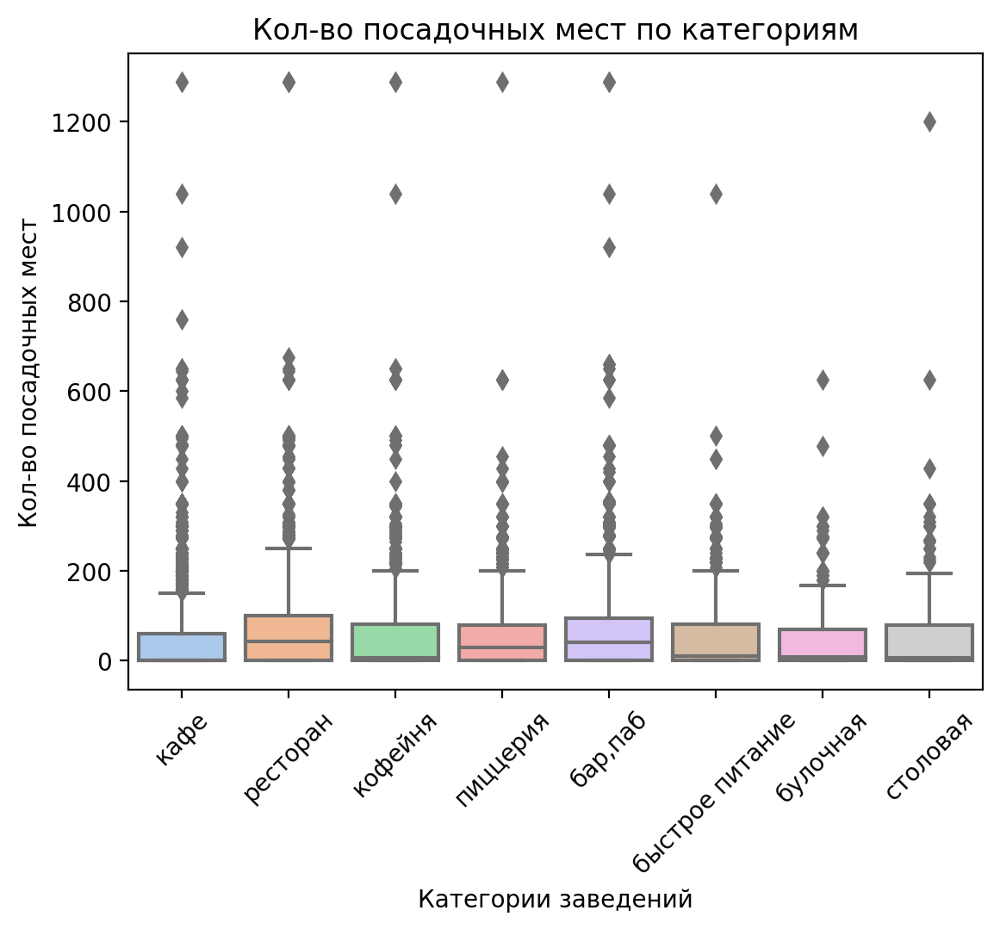

In [31]:
fig=sb.boxplot(x=data['category'],y=data['seats']).set(title = 'Кол-во посадочных мест по категориям', xlabel = 'Категории заведений', ylabel = ('Кол-во посадочных мест'));
plt.xticks(rotation=45)
plt.show()

Как и предпогалась, на графике мы видим много выбросов. Рассчитаем персентиль, чтобы отсечь выбросы.

In [32]:
np.percentile(data['seats'],[95,99])

array([250. , 490.7])

In [33]:
(data['seats']<= 490).mean() # Выбросов выше 490 посадочных мест меньше 1%, можем удалить их

0.9898857686815802

In [34]:
data=data.query('seats <= 490')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8319 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8319 non-null   object 
 1   category           8319 non-null   object 
 2   address            8319 non-null   object 
 3   district           8319 non-null   object 
 4   hours              7792 non-null   object 
 5   lat                8319 non-null   float64
 6   lng                8319 non-null   float64
 7   rating             8319 non-null   float64
 8   price              3278 non-null   object 
 9   avg_bill           3773 non-null   object 
 10  middle_avg_bill    3112 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8319 non-null   int64  
 13  seats              8319 non-null   int64  
 14  street             8319 non-null   object 
 15  is_24/7            7792 non-null   object 
dtypes: float64(5), int64(2),

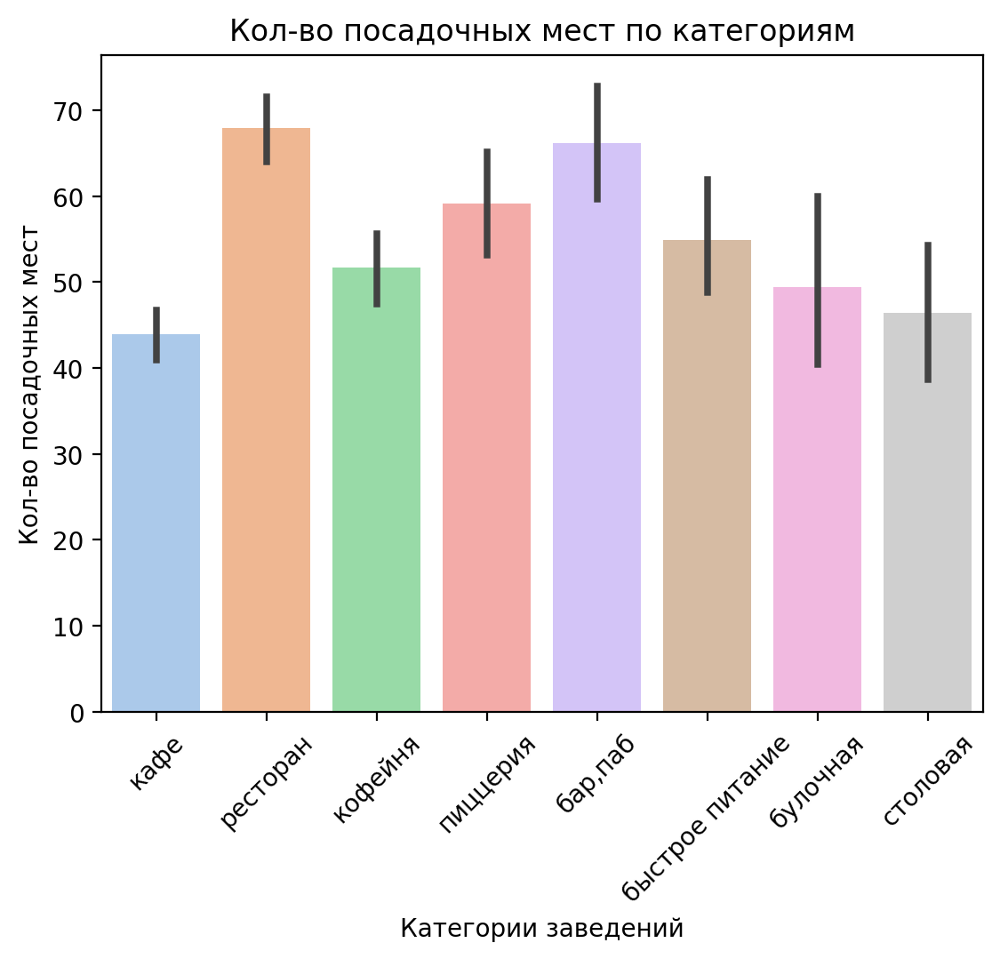

In [35]:
fig=sb.barplot(x=data['category'],y=data['seats']).set(title = 'Кол-во посадочных мест по категориям', xlabel = 'Категории заведений', ylabel = ('Кол-во посадочных мест'));
plt.xticks(rotation=45)
plt.show()

По новому графику мы видим, что опять же лидируют заведения типа "Ресторан" и "Бар,паб", меньше всего посадочных мест в "Кафе".

### Соотношение сетевых и не сетевых заведений в датасете. 

Рассмотрите и изобразите соотношение сетевых и не сетевых заведений в датасете. Каких заведений больше?

In [36]:
chains=data.groupby('chain').agg({'name':'count'}).reset_index()
chains = data.groupby(by=['category', 'chain'], as_index=False).agg(
    count=('name', 'count'))
chains.loc[chains['chain'] == 0, 'chain'] = 'Не сетевое заведение'
chains.loc[chains['chain'] == 1, 'chain'] = 'Сетевое заведение'

fig = go.Figure(data=[go.Pie(labels=chains['chain'], 
                             values=chains['count'],
                             pull = [0.1, 0])])
fig.update_layout(title='Соотношение сетевых и не сетевых заведений', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Заведения',
                                    showarrow=False)])
fig.show() #

По полученной диаграмме мы видим, что больший процент в датасете составляют не сетевые заведения (61,2%), сетевые заведения составляют 38,8 % во всем датасете.

### Категории сетевых заведений.

Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [37]:
for i in range(len(chains)):
    chains.at[i, 'ratio'] = str(round(
        chains.loc[i]['count']/len(data[data['category'] == chains.loc[i]['category']]), 1) * 100) + '%'
chains

,category,chain,count,ratio
0,"бар,паб",Не сетевое заведение,587,80.0%
1,"бар,паб",Сетевое заведение,168,20.0%
2,булочная,Не сетевое заведение,99,40.0%
3,булочная,Сетевое заведение,156,60.0%
4,быстрое питание,Не сетевое заведение,370,60.0%
5,быстрое питание,Сетевое заведение,231,40.0%
6,кафе,Не сетевое заведение,1586,70.0%
7,кафе,Сетевое заведение,769,30.0%
8,кофейня,Не сетевое заведение,686,50.0%
9,кофейня,Сетевое заведение,711,50.0%


In [38]:
fig = px.bar(chains.sort_values(by='count', ascending=True), # загружаем данные
                   x='count', 
                   y='category',
                   color='chain', 
                   text='ratio',
                   title='Соотношение сетевых и не сетевых заведений', # указываем заголовок
                   ) # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Кол-во заведений') # подпись для оси X
fig.update_yaxes(title_text='Категория') # подпись для оси Y
fig.show() # выводим график

По графику мы видим, что сетевыми чаще всего являются кафе, рестораны и кофейни. Меньше всего сетевыми заведениями являются столовая.

###  Топ-15 популярных сетей в Москве. 

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [39]:
top_chain=(data.query('chain== 1')
          .pivot_table(index=['name','category'],values=['chain'],aggfunc=['count'])
          .reset_index())
top_chain.columns=['name','category','count']
top_chain=top_chain.sort_values(by='count',ascending=False).head(15).reset_index(drop=True)
top_chain

,name,category,count
0,шоколадница,кофейня,117
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,70
4,яндекс лавка,ресторан,68
5,cofix,кофейня,65
6,prime,ресторан,48
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,38
9,теремок,ресторан,36


In [40]:
# Построим столбчатую диаграмму 
fig = px.bar(top_chain.sort_values(by='count', ascending=True),
             x='count', 
             y='name', 
             text='count',
            color='category')

fig.update_layout(title='Топ-15 популярных сетей',
                   xaxis_title='Количество заведений',
                   yaxis_title=' Название сети')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show() 

Больше всего по кол-ву заведений лидирует "Шоколадница","Домино'с пицца" и "Додо пицца", меньше всего заведений в сети "Кофемания". Все заведения относятся к сетевым. 

### Административные районы Москвы.

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [41]:
# Построим таблицу
district=(data.pivot_table(index=['district','category'],values=['name'],aggfunc=['count'])
          .reset_index())
district.columns=['district','category','count']


In [42]:
# Сделаем столбчатую диаграмму
fig = px.bar(district.sort_values(by='count', ascending=True),
             x='count', 
             y='district', 
             text='count',
            color='category')

fig.update_layout(title='Распределение заведений по районам Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show() 

По графику мы видим, что больше всего заведений находятся в Центральном административном округе, большую часть из них составляют рестораны, кафе, кофейни и бары. Меньше всего заведений в Северо-Западном округе, там распространены кафе и рестораны.

### Распределение средних рейтингов по категориям заведений.

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [43]:
data.groupby('category')['rating'].describe().sort_values(by='mean',ascending=False)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",755.0,4.390199,0.380192,1.1,4.3,4.4,4.6,5.0
пиццерия,629.0,4.300636,0.336618,1.0,4.2,4.3,4.4,5.0
ресторан,2014.0,4.289921,0.414782,1.0,4.2,4.3,4.5,5.0
кофейня,1397.0,4.277452,0.373629,1.4,4.1,4.3,4.4,5.0
булочная,255.0,4.267843,0.386975,1.3,4.2,4.3,4.4,5.0
столовая,313.0,4.211821,0.455614,1.0,4.1,4.3,4.4,5.0
кафе,2355.0,4.123609,0.567547,1.0,4.0,4.2,4.4,5.0
быстрое питание,601.0,4.049584,0.561757,1.1,3.9,4.2,4.3,5.0


In [44]:
data_rating=data.groupby(['category'],as_index=False).agg({'rating':'mean'}).sort_values(by='rating',ascending=False)

In [45]:
fig = px.histogram(data_rating, # загружаем данные
                   x='category', 
                   y='rating',
                   nbins=50,
                   title='Распределение средних рейтингов по категориям заведений', # указываем заголовок
                   ) # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Категории заведений') # подпись для оси X
fig.update_yaxes(title_text='Рейтинг') # подпись для оси Y
fig.show() # выводим график

По полученным исследованиям и графику, мы видим, что наибольший рейтинг среди всех заведений имеют бары, пабы (средний рейтинг 4.3),наименьший рейтинг имеют заведения категории "быстрое питание". Усредненные рейтингы не сильно различаются, около 4.2-4.3.

### Фоновая картограмму (хороплет) со средним рейтингом заведений каждого района. 

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [46]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating',ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [47]:
import json
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По карте, мы можем отметить, что самый высокий рейтинг имеют заведения, которые находятся в Центральном административном округе. Наименьший рейтинг имеют заведения в Северо-Восточном и Юго-Восточном административных округах.

### Отображение всех заведений датасета на карте.

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [48]:
a = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

marker_cluster = MarkerCluster().add_to(a)

def create_clusters(row):

    icon_url = 'https://img.icons8.com/external-wanicon-flat-wanicon/344/external-mall-shop-and-store-wanicon-flat-wanicon.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
a

### Топ-15 улиц по количеству заведений. 

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [49]:
street_top=data.pivot_table(index='street',values='name',aggfunc='count').sort_values(by='name',ascending=False).head(15)
street_top1 = data[data['street'].isin(street_top.index)].groupby(['street', 'category']).count()['name'].reset_index()
street_top1

,street,category,name
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,20
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [50]:
fig = px.bar(street_top1.sort_values(by='name', ascending=True),
             x='name', 
             y='street', 
             text='name',
            color='category')

fig.update_layout(title='Распределение заведений по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

По полученному графику, мы видим, что больше всего заведений находятся на улице проспекта Мира, там большую долю составляют кафе, ресторан и кофейня,также популярны ул. Профсоюзной. пр. Вернадского и Ленинский пр. Меньше же всего заведений на улице Миклухо-Маклая, там больше всего находятся кафе и рестораны.

### Улицы, на которых находится только один объект общепита. 

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [51]:
cafe_1= data.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).query('count == 1').index.tolist()
cafe_street = data[data['street'].isin(cafe_1)].groupby(
    'category', as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)
cafe_street['total']=cafe_street['count'].sum()
cafe_street

,category,count,total
3,кафе,160,459
6,ресторан,93,459
4,кофейня,85,459
0,"бар,паб",39,459
7,столовая,36,459
2,быстрое питание,23,459
5,пиццерия,15,459
1,булочная,8,459


In [52]:
fig=go.Figure(data=[go.Pie(labels=cafe_street['category'],values=cafe_street['count'])])
fig.update_layout(title='Соотношение категорий заведений на улицах')
fig.show()

На улицах, на которых находится только 1 объект общепита,чаще всего этот объект относится к категориям "Кафе","Ресторан" и "Кофейня". Такие заведения как булочная, бар, пиццерия и быстрое питание, скорее всего открываются там, где большой поток клиентов. 

### Медиана средних чеков для каждого района.

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [53]:
avg_bill=data.groupby('district', as_index=False)['middle_avg_bill'].agg('mean').sort_values(by='middle_avg_bill',ascending=False)
avg_bill['middle_avg_bill'] = round(avg_bill['middle_avg_bill'], 2)
avg_bill

,district,middle_avg_bill
5,Центральный административный округ,1193.93
1,Западный административный округ,1038.59
2,Северный административный округ,923.57
8,Южный административный округ,834.40
4,Северо-Западный административный округ,822.22
0,Восточный административный округ,815.61
7,Юго-Западный административный округ,792.71
3,Северо-Восточный административный округ,716.61
6,Юго-Восточный административный округ,651.01


In [54]:
# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Средний чек заведений по районам',
).add_to(moscow)

# выводим карту
moscow

Ожидаемо, самый высокий средний чек находится в Центральном административном округе и в Западном административном округе, меньший чек находится в Юго-Восточном административном округе. В целом, отдаленность от центра сильно влияет на средний чек. Меньшие чеки на восточном направлении Москвы, более дорогие чеки на Севере Москвы.

### Вывод по наблюдениям.

1. Больше всего в данных заведений категории "Кафе" и "Ресторан" и "Кофейня", меньше всего заведений категорий "Столовая" и "Булочная".
2. В среднем больше всего посадочных мест в заведениях категорий "Ресторан" и "Бар, паб", меньше всего мест в "Кафе". 
3. Больший процент в датасете составляют не сетевые заведения (61,2%), сетевые заведения составляют 38,8 % во всем датасете.
4. Самые популярные заведения сетевые, категории в них :кофейня, кафе, ресторан, пиццерия и булочная. Меньше всего сетевыми являются столовые.
5. Среди сетевых заведений лидирует "Шоколадница","Домино'с пицца" и "Додо пицца", меньше всего заведений в сети "Кофемания". Все заведения относятся к сетевым.
6. Больше всего заведений находятся в Центральном административном округе, большую часть из них составляют рестораны, кафе, кофейни и бары. Меньше всего заведений в Северо-Западном округе, там распространены кафе и рестораны.
7. Наибольший рейтинг среди всех заведений имеют бары, пабы (средний рейтинг 4.3),наименьший рейтинг имеют заведения категории "быстрое питание". Усредненные рейтингы не сильно различаются, около 4.2-4.3.
8. Самый высокий рейтинг имеют заведения, которые находятся в Центральном административном округе. Наименьший рейтинг имеют заведения в Северо-Восточном и Юго-Восточном административных округах.
9. Больше всего заведений находятся на улице проспекта Мира, там большую долю составляют кафе, ресторан и кофейня,также популярны ул. Профсоюзной. пр. Вернадского и Ленинский пр. Меньше же всего заведений на улице Миклухо-Маклая, там больше всего находятся кафе и рестораны.
10. На улицах, на которых находится только 1 объект общепита,чаще всего этот объект относится к категориям "Кафе","Ресторан" и "Кофейня". Такие заведения как булочная, бар, пиццерия и быстрое питание, скорее всего открываются там, где большой поток клиентов.
11. Самый высокий средний чек находится в Центральном административном округе и в Западном административном округе, меньший чек находится в Юго-Восточном административном округе. В целом, отдаленность от центра сильно влияет на средний чек. Меньшие чеки на восточном направлении Москвы, более дорогие чеки на Севере Москвы.




## Детализация исследования: открытие кофейни.


Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

### Количество кофеен в датасете.

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [55]:
coffee = data.query('category == "кофейня"')
coffee.groupby('category', as_index=False)['district'].agg('count').sort_values(by='district',ascending=False)


,category,district
0,кофейня,1397


In [56]:
coffee_district = coffee.groupby('district')\
    .agg({'rating':'mean','name':'count', 'middle_coffee_cup':'mean' })\
    .reset_index().sort_values(by='name',ascending=False)
coffee_district['rating'] = coffee_district['rating'].round(2)
coffee_district

,district,rating,name,middle_coffee_cup
5,Центральный административный округ,4.34,425,187.518519
2,Северный административный округ,4.29,186,166.338028
3,Северо-Восточный административный округ,4.22,159,165.333333
1,Западный административный округ,4.19,146,188.562500
8,Южный административный округ,4.23,131,158.488372
0,Восточный административный округ,4.28,104,174.023810
7,Юго-Западный административный округ,4.29,95,184.176471
6,Юго-Восточный административный округ,4.23,89,151.088235
4,Северо-Западный административный округ,4.33,62,165.523810


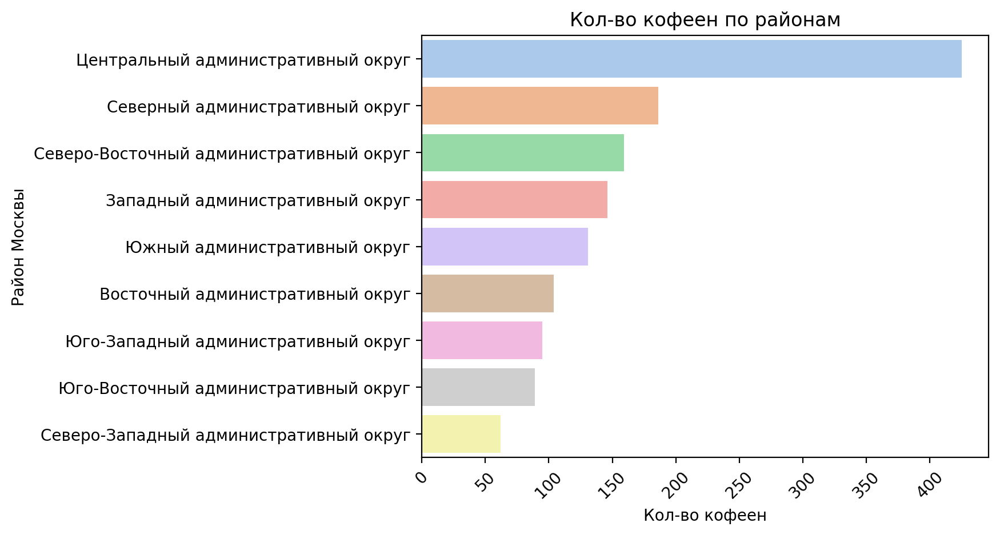

In [57]:
fig=sb.barplot(x=coffee_district['name'],y=coffee_district['district']).set(title = 'Кол-во кофеен по районам', xlabel = 'Кол-во кофеен', ylabel = 'Район Москвы');
plt.xticks(rotation=45)
plt.show()

In [58]:
# создаём карту Москвы
moscow_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Кол-во кофеен по районам',
).add_to(moscow_coffee)

# выводим карту
moscow_coffee

Всего кофеен в датасете 1397.По карте и барплоту мы можем отметить, что больше всего кофеен находятся в ЦАО,меньше всего в СЗАО.

### Круглосуточные кофейни.

Есть ли круглосуточные кофейни?

In [59]:
# Построим таблицу для дальнейшего исследования
coffee_noc=coffee.groupby(by=['district', 'is_24/7'], as_index=False).agg(count=('name', 'count')).sort_values(by='count',ascending=False)
coffee_noc


,district,is_24/7,count
10,Центральный административный округ,False,397
4,Северный административный округ,False,179
6,Северо-Восточный административный округ,False,154
2,Западный административный округ,False,135
16,Южный административный округ,False,129
0,Восточный административный округ,False,96
12,Юго-Восточный административный округ,False,87
14,Юго-Западный административный округ,False,86
8,Северо-Западный административный округ,False,60
11,Центральный административный округ,True,26


In [60]:
fig = px.bar(coffee_noc, # загружаем данные
                   x='count', 
                   y='district',
                   color='is_24/7', 
                   text='count',
                   title='Кол-во круглосуточных кофеен по районам', # указываем заголовок
                   ) # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Кол-во круглосуточных кофеен') # подпись для оси X
fig.update_yaxes(title_text='Район') # подпись для оси Y
fig.show() # выводим график

Всего круглосуточных кофеен - 59.Ожидаемо, что самое большое кол-во круглосуточных кофеен находятся в ЦАО (26 штук). Меньше всего в ЮАО и ЮВАО.

### Рейтинги по районам.

Какие у кофеен рейтинги? Как они распределяются по районам?

In [61]:
coffee_rat=coffee.groupby('district')\
    .agg({'rating':'mean','name':'count' })\
    .reset_index().sort_values(by='rating',ascending=False)
coffee_rat['rating'] = coffee_rat['rating'].round(2)
coffee_rat

,district,rating,name
5,Центральный административный округ,4.34,425
4,Северо-Западный административный округ,4.33,62
2,Северный административный округ,4.29,186
7,Юго-Западный административный округ,4.29,95
0,Восточный административный округ,4.28,104
8,Южный административный округ,4.23,131
6,Юго-Восточный административный округ,4.23,89
3,Северо-Восточный административный округ,4.22,159
1,Западный административный округ,4.19,146


In [62]:
moscow_rat = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Рейтинг кофеен по районам',
).add_to(moscow_rat)

# выводим карту
moscow_rat

По карте мы также видим, что наибольший рейтинг имеют кофейни, расположенные в ЦАО, СЗАО и САО. Самый низкий рейтинг имеют кофейни в ЗАО.

### Cтоимость чашки капучино.

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [63]:
cafe_rating_cost = coffee.groupby(by='district', as_index=False).agg(avg_cup=('middle_coffee_cup', 'median'))
cafe_rating_cost['avg_cup'] = round(cafe_rating_cost['avg_cup'])
cafe_rating_cost.sort_values(by='avg_cup',ascending=False)

,district,avg_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.0
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,148.0
0,Восточный административный округ,135.0


In [64]:
fig = px.bar(cafe_rating_cost.sort_values(by='avg_cup',ascending=True), # загружаем данные
                   x='avg_cup', 
                   y='district', 
                   text='avg_cup',
                   title='Стоимость чашки кофе по районам', # указываем заголовок
                   ) # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Средняя стоимость') # подпись для оси X
fig.update_yaxes(title_text='Район') # подпись для оси Y
fig.show()

Неожиданно, самый дорогой кофе будет в ЮЗАО, далее будет ЦАО и ЗАО. Самый дешевый кофе будет в ЮВАО и в ВАО.

### Рекомендации

Средняя стоимость чашки кофе.

In [65]:
coffee['middle_coffee_cup'].mean()

175.0640776699029

Выводы по кофейням:
1. Всего кофеен в Москве 1397. Больше всего кофеен в  ЦАО, САО и СВАО. Меньше всего кофеен в ЮЗАО, ЮВАО и СЗАО.
2. Круглосуточные кофейни распространены в ЦАО, ЗАО и ЮЗАО. Меньше всего в СЗАО, ЮВАО, ЮАО.
3. Самые высокие рейтинги кофеен в ЦАО, СЗАО, ЮЗАО и САО. Низкие рейтинги в СВАО и ЗАО.	
4. Стоимость чашек в ЮЗАО (198 р.), ЦАО (190 р.), ЗАО (187 р.). Средняя стоимость чашки кофе (175 р.)


Рекомендации:

Без дополнительных данных о стоимости арендных помещений, площади аренды, проходимости людей и прочих данных, мы можем сделать выводы только по наших данным.

Если смотреть по районам, меньше всего кофеен в 3 районах (ЮЗАО, ЮВАО и СЗАО), среди этих районах в районах СЗАО и ЮВАО меньше всего круглосуточных кофеен. В районах ЮЗАО и СЗАО самые высокие рейтинги кофеен. 

Если открывать дневную кофейню можно рассмотреть район ЮЗАО, если же смотреть круглосуточную кофейню, можно рассмотреть также район СЗАО, стоимость чашки около 175 - 180  рублей.

## Презентация

Презентация: <https://disk.yandex.ru/i/G_LspknE36RH9A> 